# Import Libraries

In [153]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import AgglomerativeClustering, KMeans, DBSCAN
from scipy.cluster import hierarchy
warnings.filterwarnings('ignore')
%matplotlib inline

In [154]:
df = pd.read_excel(r"C:\Users\priya\Downloads\World_development_mesurement.xlsx")
df

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,...,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.020,NaN,87931.0,Algeria,NaN,NaN,26998.0,"$54,790,058,957",0.035,$60,...,67.0,0.0,1,0.342,0.619,0.039,31719449,0.599,"$102,000,000","$193,000,000"
1,0.050,NaN,9542.0,Angola,NaN,NaN,7499.0,"$9,129,594,819",0.034,$22,...,44.0,0.0,1,0.476,0.499,0.025,13924930,0.324,"$34,000,000","$146,000,000"
2,0.043,NaN,1617.0,Benin,NaN,NaN,1983.0,"$2,359,122,303",0.043,$15,...,53.0,0.0,1,0.454,0.517,0.029,6949366,0.383,"$77,000,000","$50,000,000"
3,0.027,NaN,4276.0,Botswana,NaN,NaN,1836.0,"$5,788,311,645",0.047,$152,...,49.0,0.1,1,0.383,0.587,0.029,1755375,0.532,"$227,000,000","$209,000,000"
4,0.046,NaN,1041.0,Burkina Faso,NaN,NaN,NaN,"$2,610,959,139",0.051,$12,...,49.0,0.0,1,0.468,0.505,0.028,11607944,0.178,"$23,000,000","$30,000,000"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,NaN,NaN,NaN,Turks and Caicos Islands,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,1,NaN,NaN,NaN,32427,0.911,NaN,NaN
2700,0.013,46.4%,NaN,United States,5.0,4.0,2132446.0,"$16,244,600,000,000",0.179,"$8,895",...,76.0,1.0,1,0.196,0.667,0.136,313873685,0.811,"$200,092,000,000","$126,573,000,000"
2701,0.015,41.9%,NaN,Uruguay,7.0,85.0,NaN,"$50,004,354,667",0.089,"$1,308",...,74.0,1.5,1,0.220,0.639,0.140,3395253,0.948,"$2,222,000,000","$1,028,000,000"
2702,0.020,61.9%,NaN,"Venezuela, RB",144.0,180.0,NaN,"$381,286,223,859",0.046,$593,...,72.0,1.0,1,0.288,0.652,0.060,29954782,0.889,"$904,000,000","$3,202,000,000"


In [155]:
df.drop(columns=['Number of Records'],inplace=True)

In [156]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2704 entries, 0 to 2703
Data columns (total 24 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Birth Rate              2585 non-null   float64
 1   Business Tax Rate       1423 non-null   object 
 2   CO2 Emissions           2125 non-null   float64
 3   Country                 2704 non-null   object 
 4   Days to Start Business  1718 non-null   float64
 5   Ease of Business        185 non-null    float64
 6   Energy Usage            1785 non-null   float64
 7   GDP                     2494 non-null   object 
 8   Health Exp % GDP        2395 non-null   float64
 9   Health Exp/Capita       2395 non-null   object 
 10  Hours to do Tax         1416 non-null   float64
 11  Infant Mortality Rate   2444 non-null   float64
 12  Internet Usage          2531 non-null   float64
 13  Lending Interest        1880 non-null   float64
 14  Life Expectancy Female  2568 non-null   

In [157]:
df.describe()

,Birth Rate,CO2 Emissions,Days to Start Business,Ease of Business,Energy Usage,Health Exp % GDP,Hours to do Tax,Infant Mortality Rate,Internet Usage,Lending Interest,Life Expectancy Female,Life Expectancy Male,Mobile Phone Usage,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban
count,2585.000000,2.125000e+03,1718.000000,185.000000,1.785000e+03,2395.000000,1416.000000,2444.000000,2531.000000,1880.000000,2568.000000,2568.000000,2537.000000,2484.000000,2484.000000,2484.000000,2.704000e+03,2678.000000
mean,0.022715,1.423071e+05,39.999418,94.875676,7.723684e+04,0.064170,302.068503,0.032813,0.239747,0.148103,71.159268,66.461838,0.578124,0.303051,0.623481,0.073465,3.145729e+07,0.562953
std,0.011338,6.159288e+05,57.318588,54.791906,2.599239e+05,0.026325,273.299686,0.029968,0.260132,0.171829,10.708262,9.390217,0.474647,0.106577,0.069660,0.049541,1.242894e+08,0.245897
min,0.007000,7.000000e+00,1.000000,1.000000,8.000000e+00,0.008000,12.000000,0.002000,0.000000,0.005000,39.000000,37.000000,0.000000,0.118000,0.474000,0.003000,1.887600e+04,0.082000
25%,0.013000,1.360000e+03,13.000000,48.000000,3.737000e+03,0.046000,156.000000,0.009000,0.000000,0.080000,64.000000,61.000000,0.100000,0.204750,0.559000,0.033000,8.783360e+05,0.356000
50%,0.020000,8.529000e+03,26.000000,94.000000,1.433800e+04,0.061000,239.000000,0.020000,0.100000,0.120000,75.000000,69.000000,0.500000,0.299500,0.642500,0.052000,5.800324e+06,0.560000
75%,0.031000,5.910800e+04,45.000000,142.000000,4.185200e+04,0.079000,344.750000,0.053000,0.400000,0.173000,79.000000,73.250000,0.900000,0.402000,0.676000,0.112000,2.014089e+07,0.765000
max,0.053000,8.286892e+06,694.000000,189.000000,2.727728e+06,0.225000,2600.000000,0.141000,1.000000,4.965000,87.000000,88.000000,2.900000,0.500000,0.858000,0.244000,1.350695e+09,1.000000


# Examining the Datatypes

In [158]:
# For Converting the object Data-type to int/float we need to remove the special characters from those columns
#Remove $ from columns
df['GDP']=df['GDP'].astype(str).str.replace('$','',regex=True).str.replace(',','')
df['GDP']=pd.to_numeric(df['GDP'],errors='coerce')

df['Health Exp/Capita']=df['Health Exp/Capita'].astype(str).str.replace('$','',regex=True)
df['Health Exp/Capita']=pd.to_numeric(df['Health Exp/Capita'], errors='coerce')

df['Tourism Inbound']=df['Tourism Inbound'].astype(str).str.replace('$','',regex=True).str.replace(',', '')
df['Tourism Inbound'] = pd.to_numeric(df['Tourism Inbound'], errors='coerce')

df['Tourism Outbound']=df['Tourism Outbound'].astype(str).str.replace('$','',regex=True).str.replace(',', '')
df['Tourism Outbound'] = pd.to_numeric(df['Tourism Outbound'], errors='coerce')

# Remove %
df['Business Tax Rate']=df['Business Tax Rate'].astype(str).str.replace('%','',regex=True)
df['Business Tax Rate'] = pd.to_numeric(df['Business Tax Rate'], errors='coerce')

In [159]:
df.dtypes

Birth Rate                float64
Business Tax Rate         float64
CO2 Emissions             float64
Country                    object
Days to Start Business    float64
Ease of Business          float64
Energy Usage              float64
GDP                       float64
Health Exp % GDP          float64
Health Exp/Capita         float64
Hours to do Tax           float64
Infant Mortality Rate     float64
Internet Usage            float64
Lending Interest          float64
Life Expectancy Female    float64
Life Expectancy Male      float64
Mobile Phone Usage        float64
Population 0-14           float64
Population 15-64          float64
Population 65+            float64
Population Total            int64
Population Urban          float64
Tourism Inbound           float64
Tourism Outbound          float64
dtype: object

# Checking and Handling the missing value

In [160]:
df.isna().sum()

Birth Rate                 119
Business Tax Rate         1281
CO2 Emissions              579
Country                      0
Days to Start Business     986
Ease of Business          2519
Energy Usage               919
GDP                        210
Health Exp % GDP           309
Health Exp/Capita          772
Hours to do Tax           1288
Infant Mortality Rate      260
Internet Usage             173
Lending Interest           824
Life Expectancy Female     136
Life Expectancy Male       136
Mobile Phone Usage         167
Population 0-14            220
Population 15-64           220
Population 65+             220
Population Total             0
Population Urban            26
Tourism Inbound            368
Tourism Outbound           471
dtype: int64

In [161]:
# Define thresholds
drop_threshold = 0.5  # Drop column if more than 50% missing
impute_threshold = 0.05  # Replace missing values if between 5% and 50% missing

# Function to calculate missing values and handle them
def handle_missing_values(df):
    # Calculate the percentage of missing values for each column
    missing_percentage = df.isnull().mean()

    # Create a dictionary to store actions taken for each column
    actions = {}

    # Loop through columns and act based on the percentage of missing values
    for column in df.columns:
        pct_missing = missing_percentage[column]

        if pct_missing > drop_threshold:
            # Drop column if more than 50% values are missing
            df.drop(columns=[column], inplace=True)
            actions[column] = "Dropped"

        elif pct_missing > impute_threshold:
            # Impute/replace if between 5% and 50% missing (we'll use median for numeric and mode for categorical)
            if df[column].dtype == 'object':
                # For categorical columns, replace with mode
                df[column].fillna(df[column].mode()[0], inplace=True)
            else:
                # For numeric columns, replace with median
                df[column].fillna(df[column].median(), inplace=True)
            actions[column] = "Imputed"

        else:
            # Retain if less than 5% missing and handle minimally (could still impute if desired)
            if df[column].isnull().any():
                if df[column].dtype == 'object':
                    df[column].fillna(df[column].mode()[0], inplace=True)
                else:
                    df[column].fillna(df[column].mean(), inplace=True)
            actions[column] = "Retained"

    # Return cleaned dataframe and actions dictionary
    return df, actions

# Apply function to handle missing values
df_cleaned, actions_taken = handle_missing_values(df)

# Display actions taken for each column
print("Actions taken for each column:")
for column, action in actions_taken.items():
    print(f"{column}: {action}")

Actions taken for each column:
Birth Rate: Retained
Business Tax Rate: Imputed
CO2 Emissions: Imputed
Country: Retained
Days to Start Business: Imputed
Ease of Business: Dropped
Energy Usage: Imputed
GDP: Imputed
Health Exp % GDP: Imputed
Health Exp/Capita: Imputed
Hours to do Tax: Imputed
Infant Mortality Rate: Imputed
Internet Usage: Imputed
Lending Interest: Imputed
Life Expectancy Female: Imputed
Life Expectancy Male: Imputed
Mobile Phone Usage: Imputed
Population 0-14: Imputed
Population 15-64: Imputed
Population 65+: Imputed
Population Total: Retained
Population Urban: Retained
Tourism Inbound: Imputed
Tourism Outbound: Imputed


# Examining the Datatypes

In [162]:
df.isna().sum()  #checking the dtypes again

Birth Rate                0
Business Tax Rate         0
CO2 Emissions             0
Country                   0
Days to Start Business    0
Energy Usage              0
GDP                       0
Health Exp % GDP          0
Health Exp/Capita         0
Hours to do Tax           0
Infant Mortality Rate     0
Internet Usage            0
Lending Interest          0
Life Expectancy Female    0
Life Expectancy Male      0
Mobile Phone Usage        0
Population 0-14           0
Population 15-64          0
Population 65+            0
Population Total          0
Population Urban          0
Tourism Inbound           0
Tourism Outbound          0
dtype: int64

# Univariate Analysis

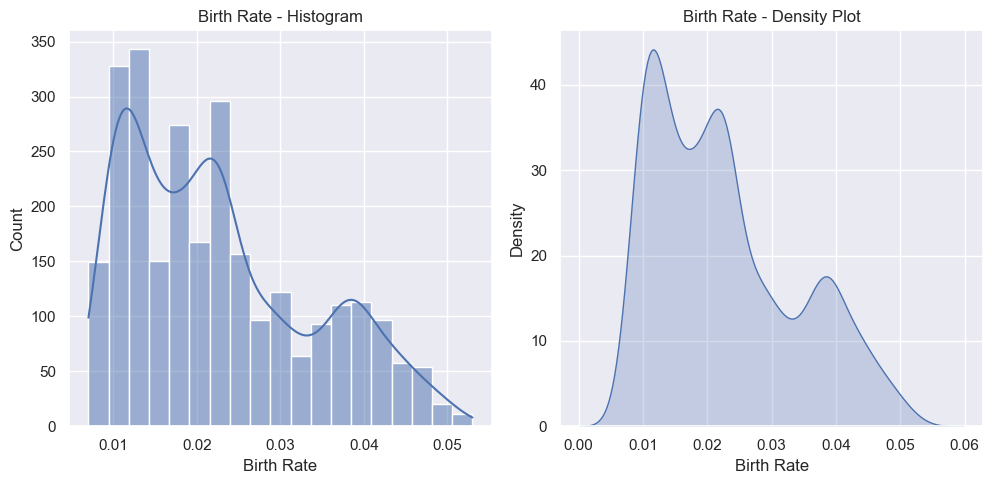

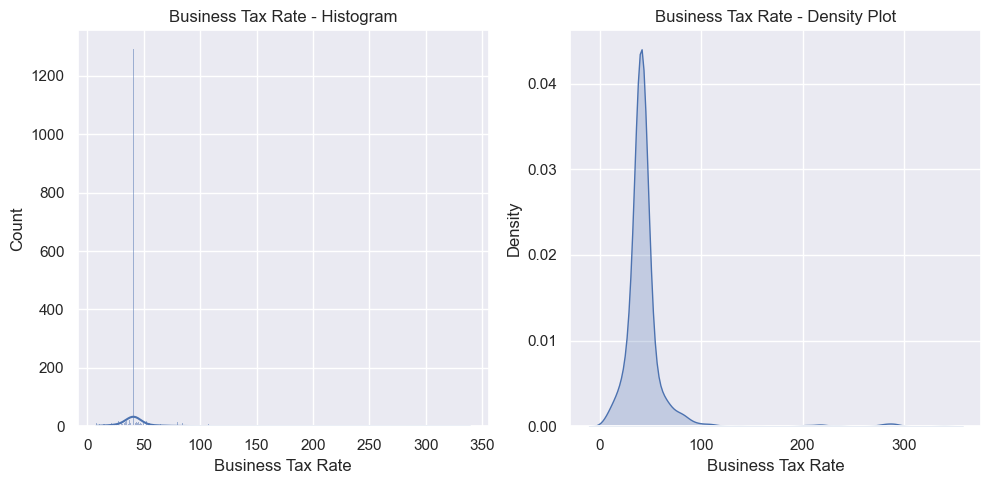

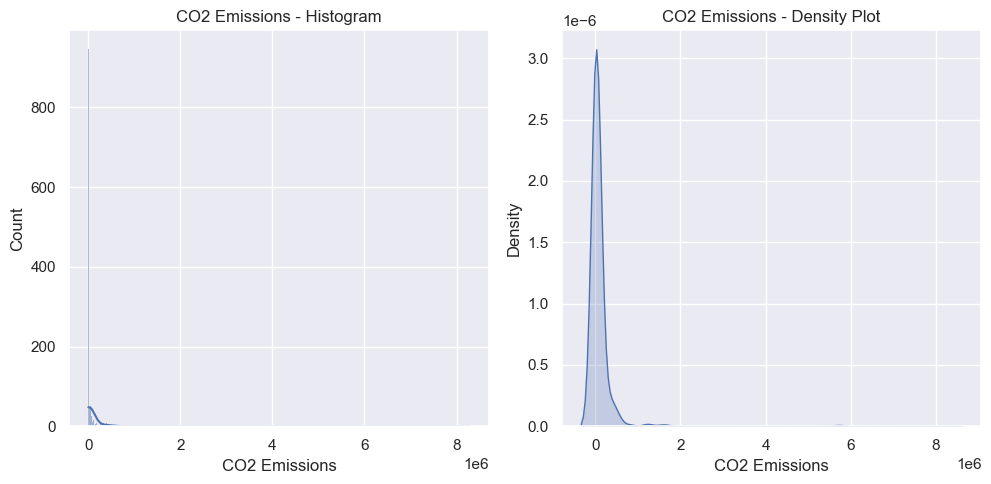

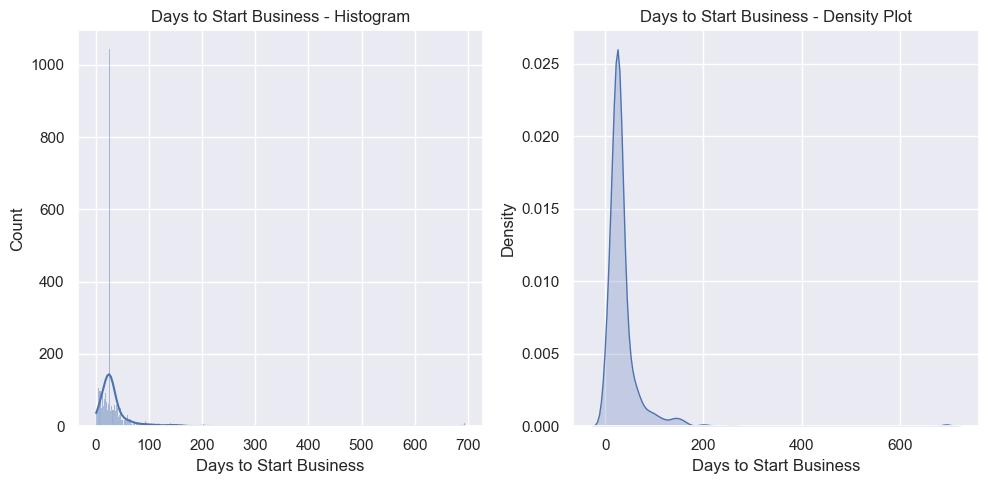

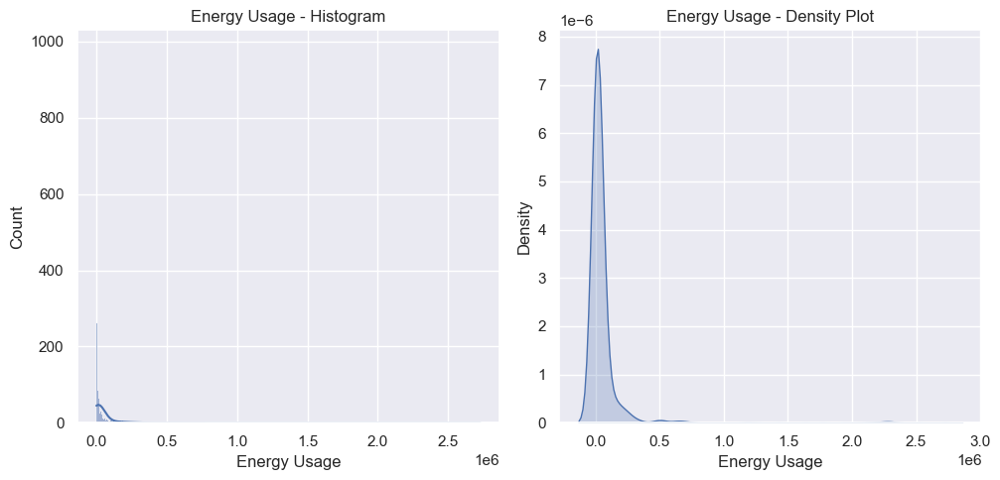

...

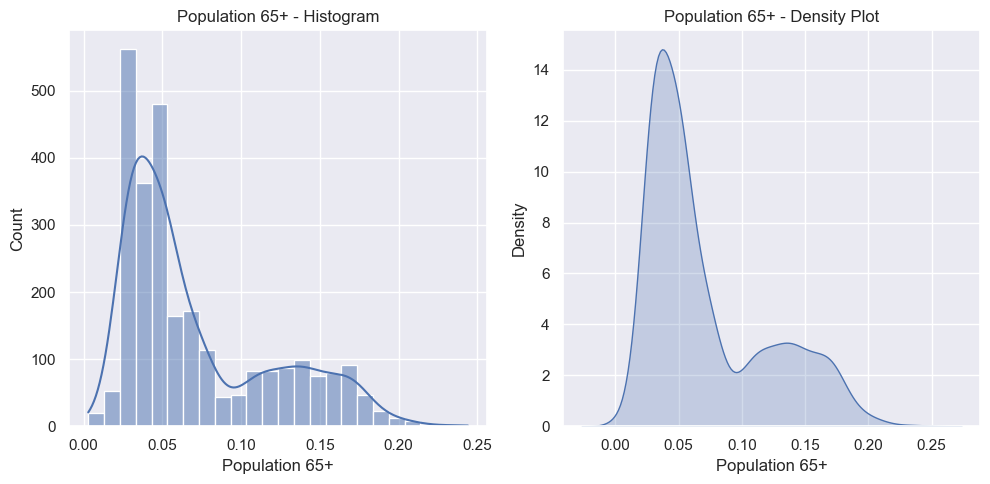

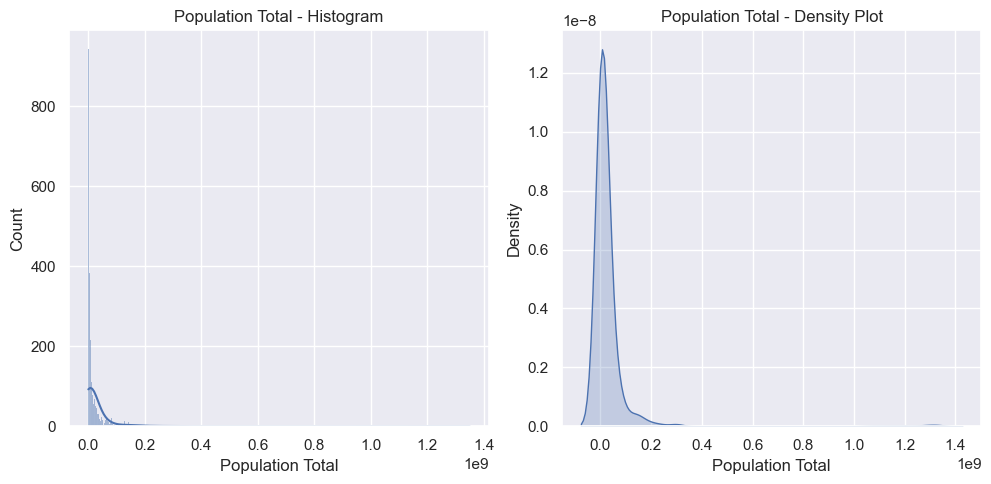

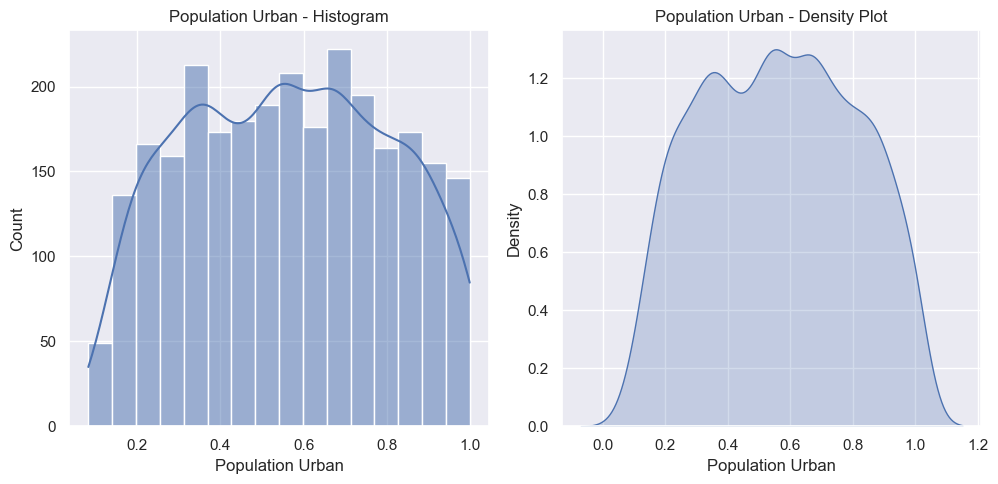

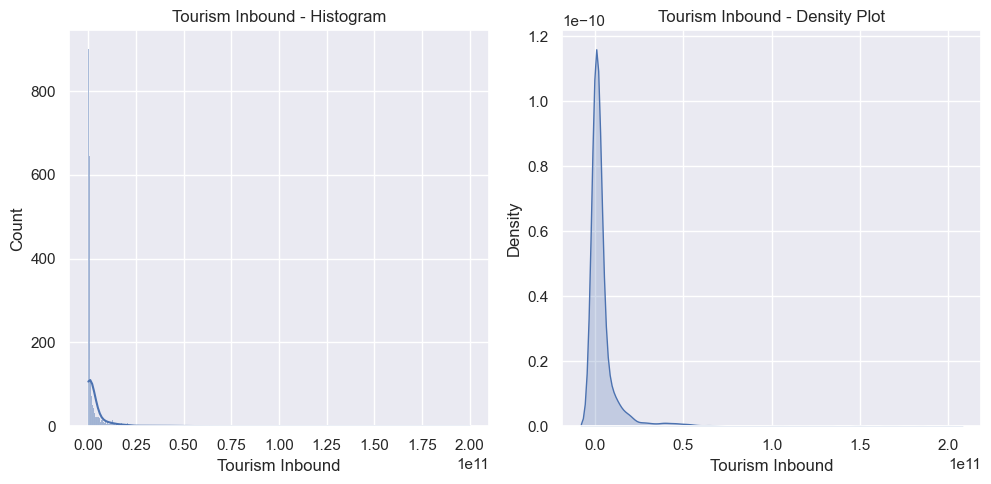

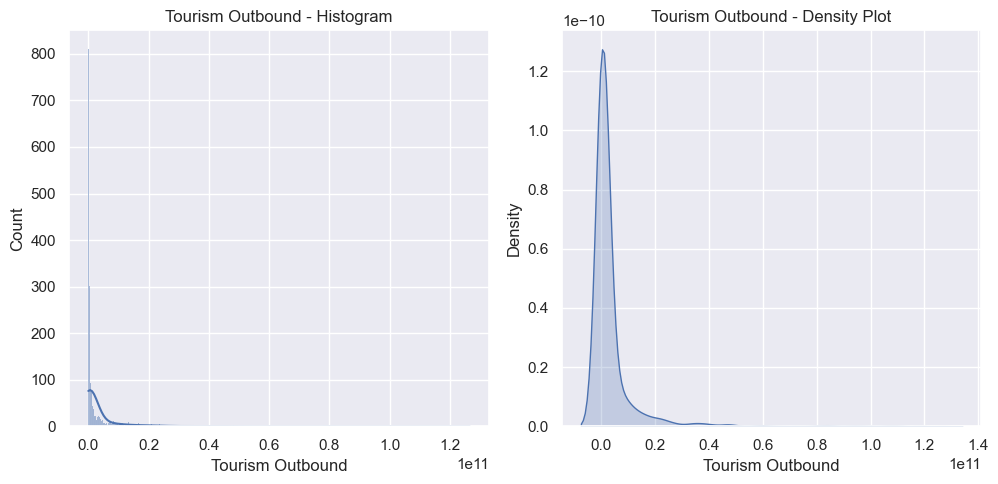

In [163]:
# Separate columns into numerical and categorical
numerical_columns = df.select_dtypes(include='number').columns
categorical_columns = df.select_dtypes(include='object').columns

# Histogram, Box plot, and Density plot for each numerical column and distribution of data across colunns
for column in numerical_columns:
    plt.figure(figsize=(15, 5))

    # Histogram
    plt.subplot(1, 3, 1)
    sns.histplot(df[column], kde=True)
    plt.title(f'{column} - Histogram')

    # Density plot
    plt.subplot(1, 3, 2)
    sns.kdeplot(df[column], shade=True)
    plt.title(f'{column} - Density Plot')

    plt.tight_layout()
    plt.show()

# Interpretation of Histogram
- Skewed:
   - Right-skewed (Positive skew): If the histogram has a long tail to the right, it indicates that most values are on the lower side, with some large outliers.
  - Left-skewed (Negative skew): A long tail to the left suggests most values are higher, with some small outliers.
- Uniform: If all bins have approximately the same height, it suggests a uniform distribution where values are equally spread.
- Bimodal or Multimodal: Multiple peaks (modes) suggest the presence of subgroups or clusters within the data.

In [164]:
# Frequency counts for each categorical column
for column in categorical_columns:
    frequency_counts = df[column].value_counts()
    print(f"Frequency Counts for {column}:\n", frequency_counts)

# # Bar Plot and Pie Chart for each categorical column
# for column in categorical_columns:
#     plt.figure(figsize=(25, 15))

#     # Bar plot
#     plt.subplot(1, 2, 1)
#     sns.countplot(x=df[column])
#     plt.title(f'{column} - Bar Plot')
#     plt.xticks(rotation=90)

#     plt.tight_layout()
#     plt.show()

Frequency Counts for Country:
 Algeria                  13
Angola                   13
Turkey                   13
Ukraine                  13
United Kingdom           13
                         ..
Malaysia                 13
Maldives                 13
Mongolia                 13
Myanmar                  13
Virgin Islands (U.S.)    13
Name: Country, Length: 208, dtype: int64


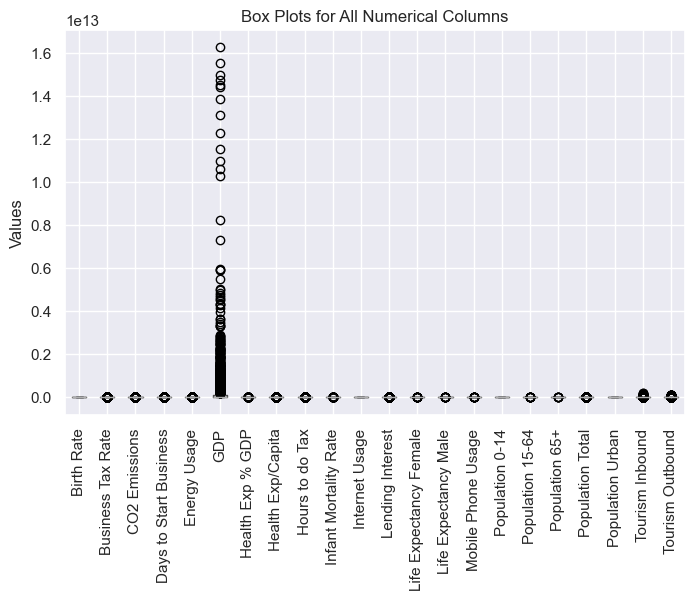

In [165]:
# Box plot for Outliers Detection
df[numerical_columns].boxplot(figsize=(8, 5))
plt.title("Box Plots for All Numerical Columns")
plt.xticks(rotation=90)
plt.ylabel("Values")
plt.show()

# Interpretation of the boxtplot
- From the above plot we can say that almost every column has outliers

# Bivariate Analysis

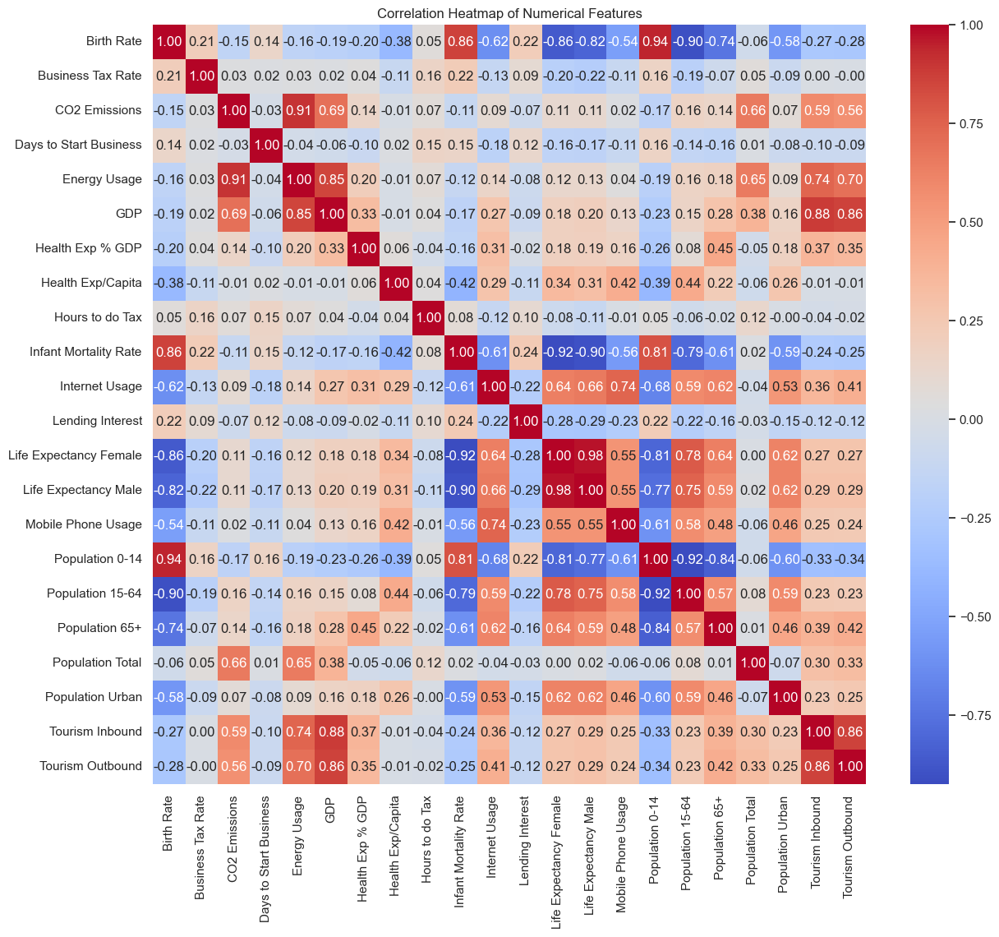

In [166]:
# Plotting a heatmap to visualize correlations among numeric features
plt.figure(figsize=(14, 12))
correlation_matrix = df[numerical_columns].corr()
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Correlation Heatmap of Numerical Features")
plt.show()

In [167]:
# since birth rate and population 0-14 are higly coreleated we droped one of these columns 
df.drop(columns=['Population 0-14'])

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,Hours to do Tax,...,Lending Interest,Life Expectancy Female,Life Expectancy Male,Mobile Phone Usage,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.020000,41.0,87931.0,Algeria,26.0,26998.0,5.479006e+10,0.035,60.0,239.0,...,0.100,71.0,67.0,0.0,0.6190,0.039,31719449,0.599,1.020000e+08,1.930000e+08
1,0.050000,41.0,9542.0,Angola,26.0,7499.0,9.129595e+09,0.034,22.0,239.0,...,1.032,47.0,44.0,0.0,0.4990,0.025,13924930,0.324,3.400000e+07,1.460000e+08
2,0.043000,41.0,1617.0,Benin,26.0,1983.0,2.359122e+09,0.043,15.0,239.0,...,0.120,57.0,53.0,0.0,0.5170,0.029,6949366,0.383,7.700000e+07,5.000000e+07
3,0.027000,41.0,4276.0,Botswana,26.0,1836.0,5.788312e+09,0.047,152.0,239.0,...,0.155,52.0,49.0,0.1,0.5870,0.029,1755375,0.532,2.270000e+08,2.090000e+08
4,0.046000,41.0,1041.0,Burkina Faso,26.0,14338.0,2.610959e+09,0.051,12.0,239.0,...,0.120,52.0,49.0,0.0,0.5050,0.028,11607944,0.178,2.300000e+07,3.000000e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,0.022715,41.0,8529.0,Turks and Caicos Islands,26.0,14338.0,1.507975e+10,0.061,115.5,239.0,...,0.120,75.0,69.0,0.5,0.6425,0.052,32427,0.911,6.885000e+08,4.560000e+08
2700,0.013000,46.4,8529.0,United States,5.0,2132446.0,1.624460e+13,0.179,115.5,175.0,...,0.033,81.0,76.0,1.0,0.6670,0.136,313873685,0.811,2.000920e+11,1.265730e+11
2701,0.015000,41.9,8529.0,Uruguay,7.0,14338.0,5.000435e+10,0.089,115.5,310.0,...,0.112,80.0,74.0,1.5,0.6390,0.140,3395253,0.948,2.222000e+09,1.028000e+09
2702,0.020000,61.9,8529.0,"Venezuela, RB",144.0,14338.0,3.812862e+11,0.046,593.0,792.0,...,0.164,78.0,72.0,1.0,0.6520,0.060,29954782,0.889,9.040000e+08,3.202000e+09


# What Does correlation plot says -
- Strong Positive Correlations:

  - Life Expectancy Female and Life Expectancy Male have a high positive correlation, indicating similar trends in life expectancy across genders.
  - Population Urban correlates with Internet Usage and Mobile Phone Usage, suggesting higher technology penetration in urban areas.
  - GDP and Energy Usage are positively correlated, which is typical for more industrialized nations.
        
- Negative Correlations:

   - Infant Mortality Rate is negatively correlated with Life Expectancy (both male and female), a common indicator of healthcare quality.
   - Birth Rate shows an inverse relationship with Life Expectancy, which can suggest demographic transitions in different regions.

# Multivariate Analysis

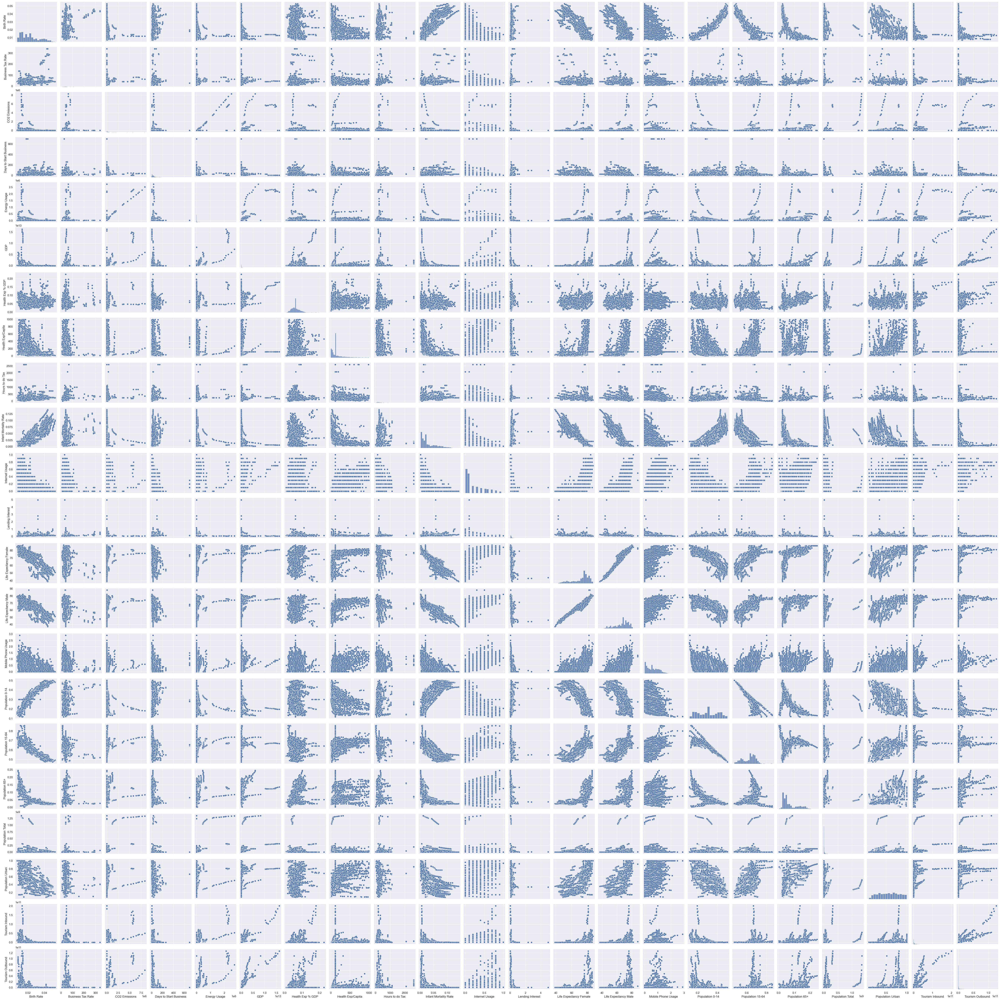

In [168]:
# Scatter plot for finding out the spread of the data across each column
sns.pairplot(df,palette='Type')

# Outliers Removal

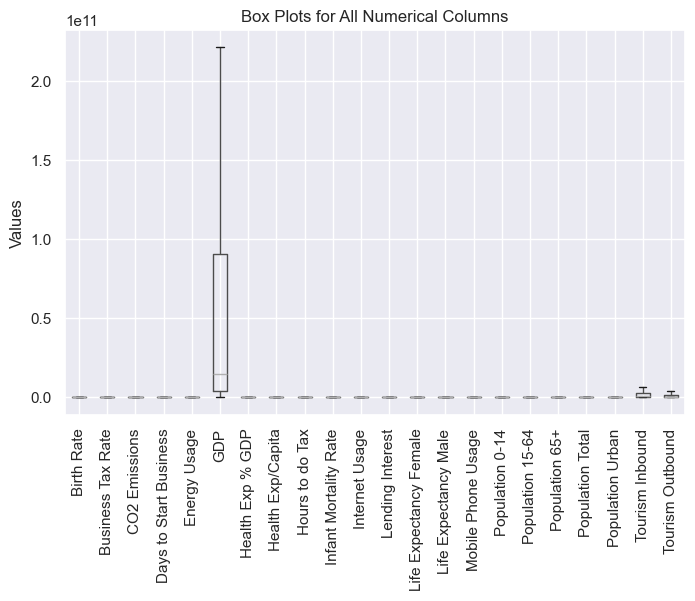

In [169]:
# Define a function to remove outliers based on IQR for selected columns
def outlier_detection(data, columns):

    # Calculate Q1 (25th percentile) and Q3 (75th percentile) for the column
    for col in columns:
        q1 = data[col].quantile(0.25)
        q3 = data[col].quantile(0.75)
        iqr = q3-q1

        # Define the lower and upper bounds for outliers
        lower = q1-(1.5*iqr)
        upper = q3+(1.5*iqr)

        df[col] = np.where(df[col] > upper, upper, np.where(df[col] < lower, lower,df[col]))

# Remove outliers from the specified columns
outlier_detection(df, df.select_dtypes(include='number').columns)

# Box plot for Outliers Detection
df.boxplot(figsize=(8, 5))
plt.title("Box Plots for All Numerical Columns")
plt.xticks(rotation=90)
plt.ylabel("Values")
plt.show()

# LabelEncoder Interpretation
- LabelEncoder assigns a unique integer to each unique category in the y column.
- The dictionary output will show each unique category in y and its corresponding integer label.

In [170]:
# Initialize the LabelEncoder
label_encoder = LabelEncoder()

# Fit and transform the 'y' column, converting it to integer labels
df['Country'] = label_encoder.fit_transform(df['Country'])

# Display the unique classes and their integer labels
print("Classes and their integer labels:")
print(dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_))))

Classes and their integer labels:
{'Afghanistan': 0, 'Albania': 1, 'Algeria': 2, 'American Samoa': 3, 'Andorra': 4, 'Angola': 5, 'Antigua and Barbuda': 6, 'Argentina': 7, 'Armenia': 8, 'Aruba': 9, 'Australia': 10, 'Austria': 11, 'Azerbaijan': 12, 'Bahamas, The': 13, 'Bahrain': 14, 'Bangladesh': 15, 'Barbados': 16, 'Belarus': 17, 'Belgium': 18, 'Belize': 19, 'Benin': 20, 'Bermuda': 21, 'Bhutan': 22, 'Bolivia': 23, 'Bosnia and Herzegovina': 24, 'Botswana': 25, 'Brazil': 26, 'Brunei Darussalam': 27, 'Bulgaria': 28, 'Burkina Faso': 29, 'Burundi': 30, 'Cambodia': 31, 'Cameroon': 32, 'Canada': 33, 'Cayman Islands': 34, 'Central African Republic': 35, 'Chad': 36, 'Chile': 37, 'China': 38, 'Colombia': 39, 'Comoros': 40, 'Congo, Dem. Rep.': 41, 'Congo, Rep.': 42, 'Costa Rica': 43, "Cote d'Ivoire": 44, 'Croatia': 45, 'Cuba': 46, 'Curacao': 47, 'Cyprus': 48, 'Czech Republic': 49, 'Denmark': 50, 'Djibouti': 51, 'Dominica': 52, 'Dominican Republic': 53, 'Ecuador': 54, 'Egypt, Arab Rep.': 55, 'El Sa

# Pre-Processing and Feature Selection / Extraction

In [171]:
# Storing all the Dependent columns in X variable AND Country column to Y
# Scaling the Data
sc = StandardScaler()
scaled_df = sc.fit_transform(df)

In [172]:
scaled_df

array([[-0.24493851, -0.06479222,  1.6597329 , ...,  0.14733294,
        -0.75422218, -0.67080356],
       [ 2.46167047, -0.06479222, -0.48614244, ..., -0.97664639,
        -0.78397614, -0.70238312],
       [ 1.83012837, -0.06479222, -0.70308693, ..., -0.73550173,
        -0.76516114, -0.76688605],
       ...,
       [-0.69604001,  0.28529294, -0.51387301, ...,  1.57376489,
         0.17340119, -0.10976242],
       [-0.24493851,  1.54948934, -0.51387301, ...,  1.33262023,
        -0.40330051,  1.35096026],
       [-1.05692121, -0.06479222, -0.51387301, ...,  1.57785208,
        -0.4975943 , -0.4940924 ]])

In [173]:
pca = PCA()
Principal_comps = pca.fit_transform(scaled_df)
scaled_df

array([[-0.24493851, -0.06479222,  1.6597329 , ...,  0.14733294,
        -0.75422218, -0.67080356],
       [ 2.46167047, -0.06479222, -0.48614244, ..., -0.97664639,
        -0.78397614, -0.70238312],
       [ 1.83012837, -0.06479222, -0.70308693, ..., -0.73550173,
        -0.76516114, -0.76688605],
       ...,
       [-0.69604001,  0.28529294, -0.51387301, ...,  1.57376489,
         0.17340119, -0.10976242],
       [-0.24493851,  1.54948934, -0.51387301, ...,  1.33262023,
        -0.40330051,  1.35096026],
       [-1.05692121, -0.06479222, -0.51387301, ...,  1.57785208,
        -0.4975943 , -0.4940924 ]])

In [174]:
pd.DataFrame(Principal_comps)

,0,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,22
0,-0.743879,1.223582,-1.376725,0.894499,-1.118312,-2.098264,-0.558549,0.533977,0.687632,-0.724358,...,0.124799,-0.248223,-0.170904,-0.425287,0.303455,0.022875,0.257018,-0.363102,0.090227,-0.004716
1,-6.049579,1.506447,0.451106,-0.924923,-1.591133,-0.616085,0.646872,1.020399,0.635777,0.619953,...,-0.234405,-0.755703,0.248926,-0.318963,0.082551,-0.341563,0.060002,0.302462,-0.127332,0.009006
2,-4.695241,0.385338,0.468252,-0.586189,-1.805048,-0.713519,-0.065686,-0.014135,-0.019384,-0.381962,...,-0.076725,-0.419855,0.077773,-0.222026,0.233613,-0.475571,0.083413,0.066789,-0.199384,0.003501
3,-3.458247,-0.401821,-0.295107,-0.417698,-1.111852,-0.439352,0.469014,0.455613,0.843053,0.036054,...,0.025123,0.146410,0.204095,-0.179903,0.254381,0.789847,0.212178,-0.401582,0.040954,0.003413
4,-5.171741,1.179615,0.910556,-0.663255,-1.650708,-0.371874,0.121057,-0.058651,0.192203,-0.953686,...,-0.236070,-0.288638,0.253559,0.115769,-0.097930,-0.269322,0.030413,0.210403,-0.148258,-0.005092
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,-0.171785,-1.250215,0.094424,0.709188,0.842771,0.115660,-0.929971,0.062919,-0.537024,1.037402,...,0.320579,0.210764,-0.310571,0.321029,-0.175555,0.106996,0.036574,0.123262,-0.050867,0.028304
2700,5.429172,1.940296,2.994565,-1.281368,0.408236,0.877578,-1.556889,-1.084982,0.137285,-0.062782,...,1.880308,0.455282,0.606091,0.691252,-0.305602,0.250291,-0.075529,-0.037386,0.007940,-0.012971
2701,2.609350,-1.448006,0.585577,-1.497736,0.974368,1.581034,-0.809361,1.129995,-1.961942,0.423230,...,0.306574,-0.279170,-0.718826,0.082960,-0.150501,0.056412,-0.030708,-0.102055,0.068632,-0.005240
2702,1.799207,0.718247,-2.323594,0.324522,0.786661,2.820684,0.129023,-0.718663,-0.588021,2.286043,...,1.005350,-0.304909,0.982031,0.757157,1.347482,-0.225216,0.142687,-0.232744,-0.039801,-0.010037


Text(0.5, 1.0, 'Scree Plot')

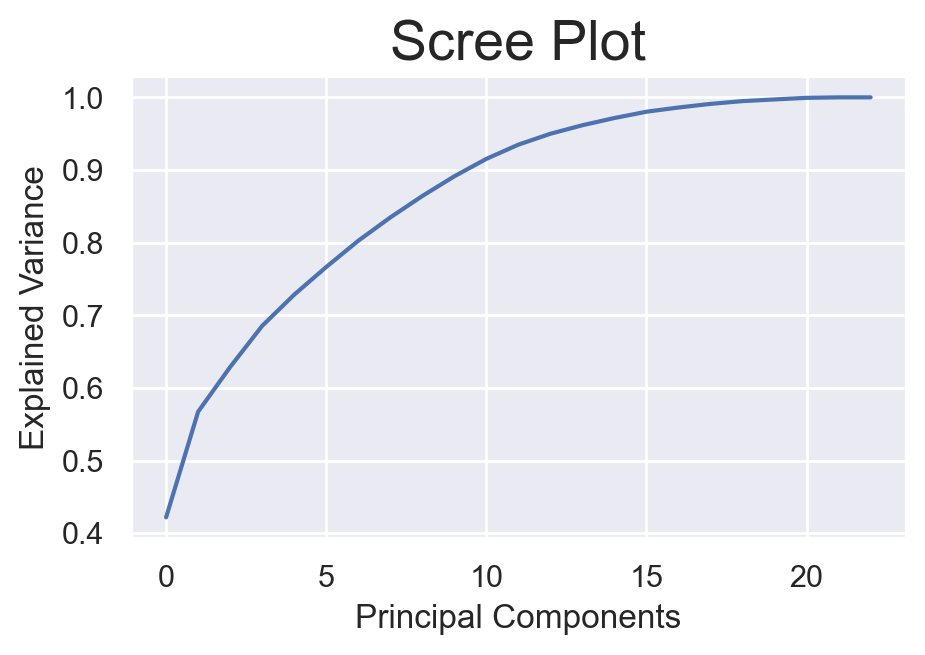

In [175]:
# Scree plot for PCA components 
plt.figure(figsize=(5,3),dpi=200)
sns.set_theme(style='darkgrid')
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Principal Components')
plt.ylabel('Explained Variance')
plt.title('Scree Plot', size = 20)

In [176]:
#Reducing the Dimensionality of the data with the help of PCA
pca = PCA(n_components=16)
principals_components = pca.fit_transform(scaled_df)
pd.DataFrame(principals_components)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,-0.743879,1.223582,-1.376725,0.894499,-1.118312,-2.098264,-0.558549,0.533977,0.687632,-0.724358,0.585934,-0.027175,-0.900578,0.124799,-0.248223,-0.170904
1,-6.049579,1.506447,0.451106,-0.924923,-1.591133,-0.616085,0.646872,1.020399,0.635777,0.619953,-1.030175,-0.526075,0.414568,-0.234405,-0.755703,0.248926
2,-4.695241,0.385338,0.468252,-0.586189,-1.805048,-0.713519,-0.065686,-0.014135,-0.019384,-0.381962,0.270368,-0.471390,0.459946,-0.076725,-0.419855,0.077773
3,-3.458247,-0.401821,-0.295107,-0.417698,-1.111852,-0.439352,0.469014,0.455613,0.843053,0.036054,-0.259245,-1.158427,0.608255,0.025123,0.146410,0.204095
4,-5.171741,1.179615,0.910556,-0.663255,-1.650708,-0.371874,0.121057,-0.058651,0.192203,-0.953686,0.011466,-0.326239,0.056500,-0.236070,-0.288638,0.253559
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,-0.171785,-1.250215,0.094424,0.709188,0.842771,0.115660,-0.929971,0.062919,-0.537024,1.037402,0.958258,-0.823153,-0.125742,0.320579,0.210764,-0.310571
2700,5.429172,1.940296,2.994565,-1.281368,0.408236,0.877578,-1.556889,-1.084982,0.137285,-0.062782,0.314347,0.499673,-0.097339,1.880308,0.455282,0.606091
2701,2.609350,-1.448006,0.585577,-1.497736,0.974368,1.581034,-0.809361,1.129995,-1.961942,0.423230,0.502922,-0.655337,-0.562421,0.306574,-0.279170,-0.718826
2702,1.799207,0.718247,-2.323594,0.324522,0.786661,2.820684,0.129023,-0.718663,-0.588021,2.286043,-0.246128,0.771702,0.565636,1.005350,-0.304909,0.982031


In [177]:
#creating the DataFrame for the Obtained Principle components 
data = pd.DataFrame(principals_components,columns=['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10','PC11','PC12','PC13','P14','P15','P16'])
data

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,P14,P15,P16
0,-0.743879,1.223582,-1.376725,0.894499,-1.118312,-2.098264,-0.558549,0.533977,0.687632,-0.724358,0.585934,-0.027175,-0.900578,0.124799,-0.248223,-0.170904
1,-6.049579,1.506447,0.451106,-0.924923,-1.591133,-0.616085,0.646872,1.020399,0.635777,0.619953,-1.030175,-0.526075,0.414568,-0.234405,-0.755703,0.248926
2,-4.695241,0.385338,0.468252,-0.586189,-1.805048,-0.713519,-0.065686,-0.014135,-0.019384,-0.381962,0.270368,-0.471390,0.459946,-0.076725,-0.419855,0.077773
3,-3.458247,-0.401821,-0.295107,-0.417698,-1.111852,-0.439352,0.469014,0.455613,0.843053,0.036054,-0.259245,-1.158427,0.608255,0.025123,0.146410,0.204095
4,-5.171741,1.179615,0.910556,-0.663255,-1.650708,-0.371874,0.121057,-0.058651,0.192203,-0.953686,0.011466,-0.326239,0.056500,-0.236070,-0.288638,0.253559
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,-0.171785,-1.250215,0.094424,0.709188,0.842771,0.115660,-0.929971,0.062919,-0.537024,1.037402,0.958258,-0.823153,-0.125742,0.320579,0.210764,-0.310571
2700,5.429172,1.940296,2.994565,-1.281368,0.408236,0.877578,-1.556889,-1.084982,0.137285,-0.062782,0.314347,0.499673,-0.097339,1.880308,0.455282,0.606091
2701,2.609350,-1.448006,0.585577,-1.497736,0.974368,1.581034,-0.809361,1.129995,-1.961942,0.423230,0.502922,-0.655337,-0.562421,0.306574,-0.279170,-0.718826
2702,1.799207,0.718247,-2.323594,0.324522,0.786661,2.820684,0.129023,-0.718663,-0.588021,2.286043,-0.246128,0.771702,0.565636,1.005350,-0.304909,0.982031


In [178]:
data1 = data.copy()    # For KMeans Clustering
data2 = data.copy()    # For Algomerative/Herarchical Clustering
data3 = data.copy()    # For DBSCAN Clustering

# KMeans Clustering 

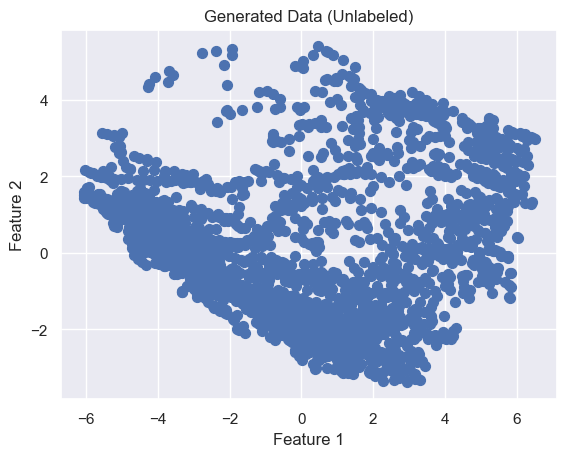

In [179]:
# Step 2: Visualize the data
# Plot the generated data to see the points before clustering
plt.scatter(data1.iloc[:, 0], data1.iloc[:, 1], s=50, cmap='viridis')
plt.title("Generated Data (Unlabeled)")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.show()

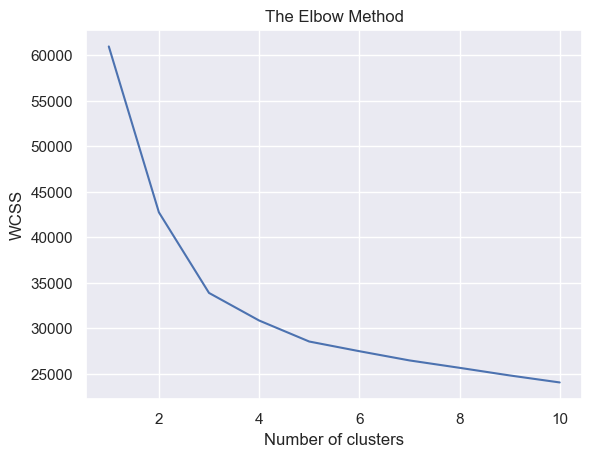

In [180]:
# Loop over potential cluster counts from 1 to 10
from sklearn.cluster import KMeans
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
    kmeans.fit(data1)
    wcss.append(kmeans.inertia_)
plt.plot(range(1, 11), wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [199]:
# selecting he no of clusters for our model
kmeans = KMeans(n_clusters = 3, init = 'k-means++', random_state = 74)
ypred = kmeans.fit_predict(data1)
ypred

array([1, 0, 0, ..., 1, 1, 1])

In [196]:
# visualizing the clusters and its centers
kmeans.cluster_centers_

array([[ 1.48029845e+00,  2.78937276e+00, -8.57380020e-01,
         9.45430714e-01,  1.39425363e-01,  1.16112287e-02,
        -9.68209959e-03,  3.61537314e-01,  3.24512802e-01,
         5.48260447e-02,  3.48538362e-02,  1.13985580e-01,
        -1.44886046e-01, -2.36504028e-02,  1.15879503e-01,
        -3.33617433e-02],
       [ 5.78545304e-01, -1.63891444e+00, -3.27770021e-01,
         1.16449792e-01,  9.22868487e-02, -9.40546768e-03,
        -5.36414567e-02,  1.03370814e-01,  9.37361887e-02,
        -4.56665520e-02,  5.80451922e-02,  2.47682740e-02,
        -6.39516331e-02,  7.17676520e-02,  3.16706650e-02,
        -4.94221585e-03],
       [-3.68300835e+00,  5.70897981e-01,  3.33851277e-01,
        -2.22990050e-01, -1.02543724e-01,  5.62050431e-02,
         4.26813682e-02, -1.29159272e-01, -1.15483660e-01,
         1.55955218e-03, -5.75128871e-02, -4.30702177e-02,
         5.29327267e-02, -1.13972325e-02, -4.81921899e-02,
         8.03406974e-03],
       [ 4.84749352e+00,  1.06097315e

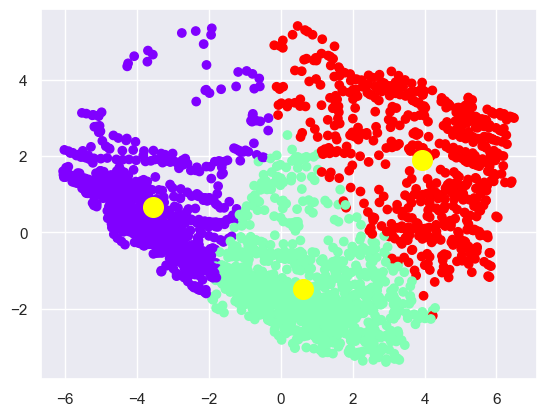

In [200]:
# Visualizing the clusters with the help of centers 
# Plot the data points colored by their predicted cluster, along with cluster centers
plt.scatter(data1.iloc[:,0],data1.iloc[:,1], c = ypred, cmap='rainbow')
plt.scatter(kmeans.cluster_centers_[:,0],kmeans.cluster_centers_[:,1], c = 'yellow',s = 200)

# DBSCAN Clustering

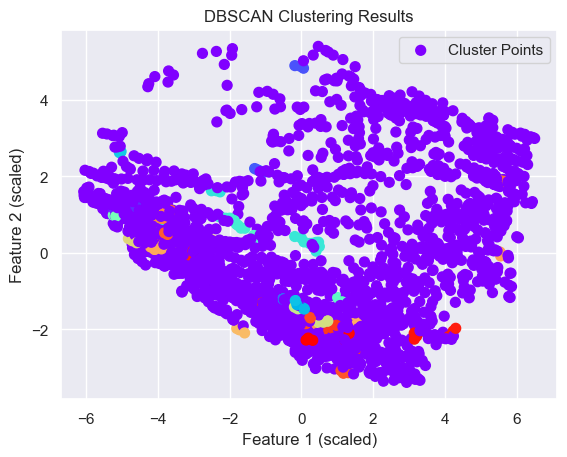

In [217]:
dbscan = DBSCAN(eps=0.3, min_samples=3)
ypredDB = dbscan.fit_predict(data3)  # Fit the model and get the cluster labels

# Step 4: Visualize the Clusters
# DBSCAN labels: -1 means noise, other integers represent different clusters
from mpl_toolkits.mplot3d import Axes3D  # For 3D plotting
plt.scatter(data3.iloc[:, 0], data3.iloc[:, 1], c=ypredDB, cmap='rainbow', s=50, label="Cluster Points")
plt.title("DBSCAN Clustering Results")
plt.xlabel("Feature 1 (scaled)")
plt.ylabel("Feature 2 (scaled)")
plt.legend()
plt.show()

In [218]:
for value in ypredDB:
    print(value)

-1
-1
0
-1
1
-1
-1
-1
-1
40
23
-1
-1
24
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
25
-1
2
-1
-1
-1
-1
-1
-1
-1
-1
-1
26
-1
3
4
-1
27
5
-1
-1
6
-1
-1
-1
7
-1
-1
-1
28
-1
-1
-1
-1
-1
-1
8
-1
-1
-1
29
-1
-1
-1
-1
-1
-1
30
-1
-1
-1
-1
-1
-1
-1
-1
-1
32
9
-1
-1
10
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
11
-1
12
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
33
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
34
-1
-1
13
-1
-1
14
-1
-1
-1
-1
-1
-1
-1
15
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
16
-1
-1
-1
35
17
-1
-1
-1
-1
-1
-1
-1
18
36
-1
-1
-1
37
19
-1
-1
-1
20
-1
-1
21
-1
-1
-1
22
-1
38
-1
-1
-1
-1
0
-1
1
-1
-1
-1
-1
40
23
-1
-1
24
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
25
-1
2
-1
-1
-1
-1
-1
-1
-1
-1
-1
26
-1
3
4
-1
27
5
-1
-1
6
-1
-1
-1
7
-1
-1
-1
28
-1
-1
-1
-1
-1
-1
8
-1
-1
-1
29
-1
-1
-1
-1
-1
-1
30
31
-1
-1
-1
-1
-1
-1
-1
-1
32
9
-1
-1
10
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
-1
11
-1
12
-1
-1
-1
-1
-1
-1
-1
41
-1
-1
-1
-1
-1
-1
-1
33
-1
-1
-1
-1
-1
-1


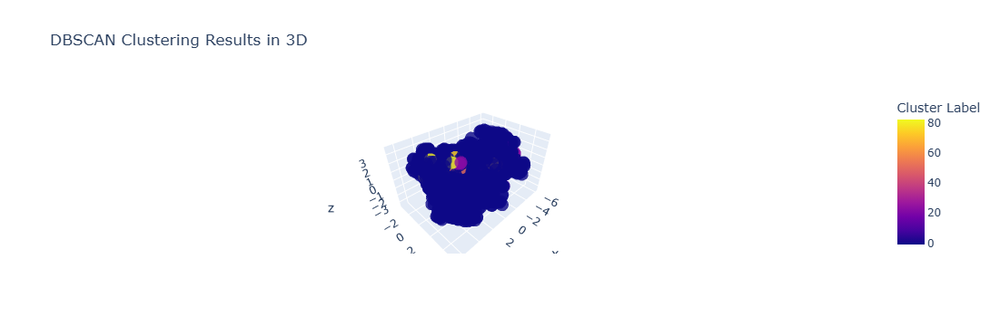

In [219]:
import plotly.express as px
px.scatter_3d(df, x=data3['PC1'], y=data3['PC2'], z=data3['PC3'], 
                    color=ypredDB,  # Convert cluster labels to strings for categorical colors
                    title="DBSCAN Clustering Results in 3D",
                    labels={'color': 'Cluster Label'},
                    opacity=0.8)


# Agglomerative / Hierarchical Clustering

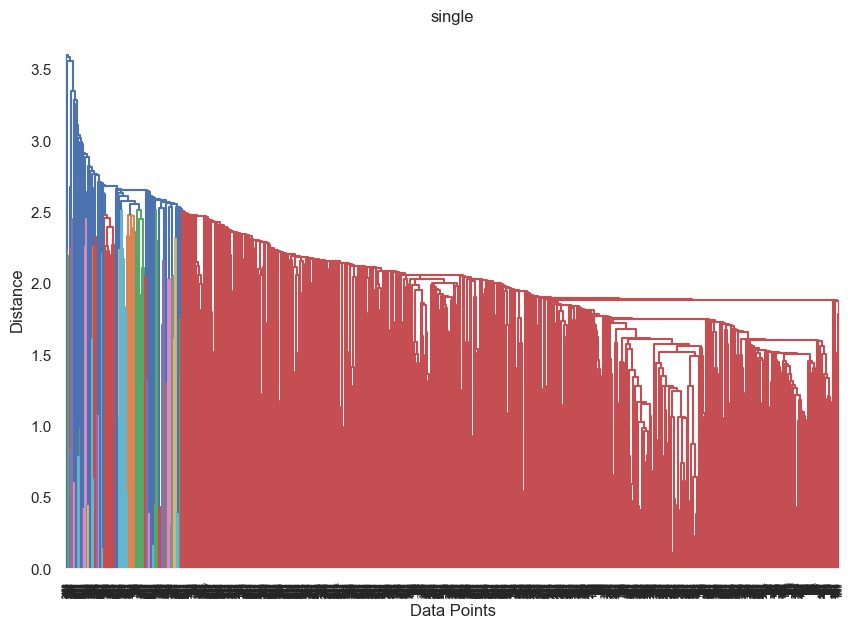

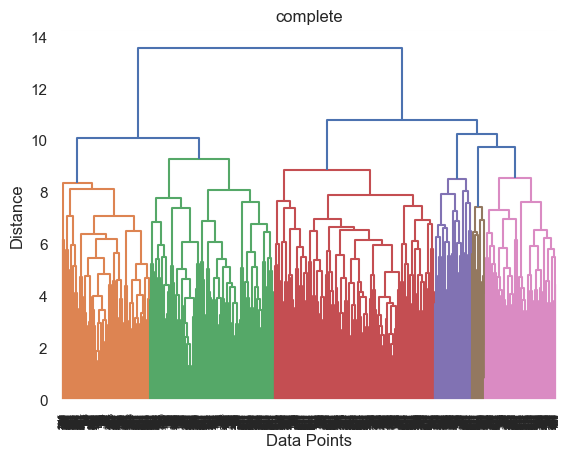

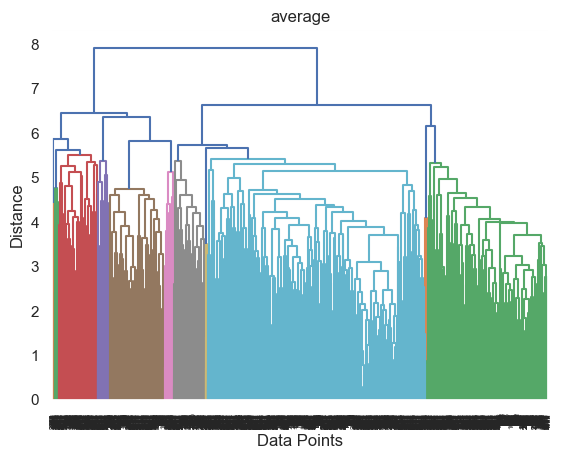

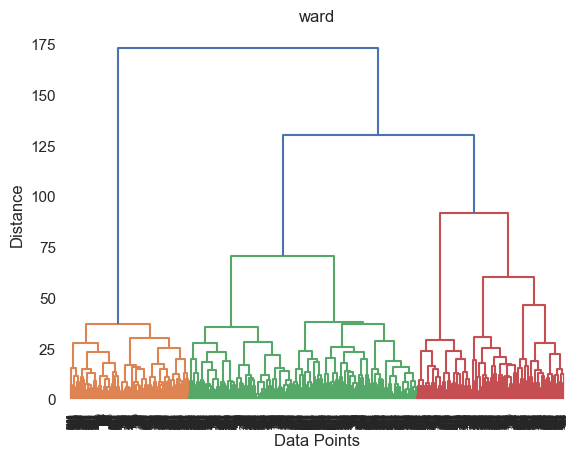

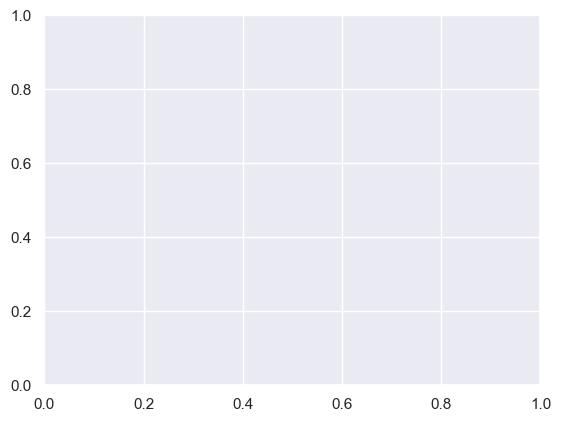

In [187]:
# For Loop over each linkage method forgenerating the dendrogram, and displaying it
Linkage=['single','complete','average','ward']
plt.figure(figsize=(10, 7))
for i, method in enumerate(Linkage):
    lk = hierarchy.linkage(scaled_df, method=method)
    dendrogram = hierarchy.dendrogram(lk)
    plt.title(method)
    plt.xlabel('Data Points')
    plt.ylabel('Distance')
    plt.show()
    plt.subplot()

<Axes: xlabel='PC1', ylabel='PC2'>

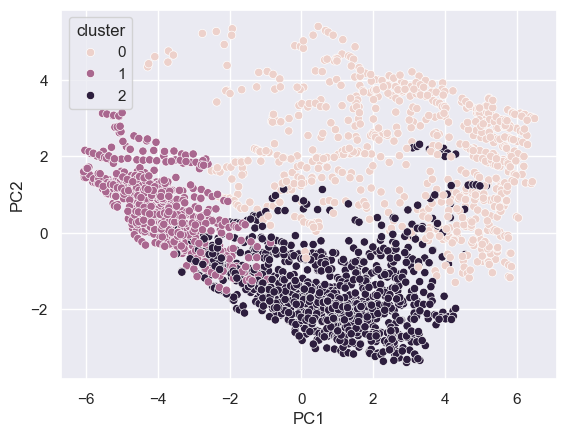

In [214]:
# Making the clusters with the optimized no of clusters concluded form the WARD Linkage method
hc = AgglomerativeClustering(n_clusters = 3, affinity = 'euclidean', linkage = 'ward')
ypredaglo = hc.fit_predict(data2)
data2['cluster'] = ypredaglo

# Visualizing the clusters 
sns.scatterplot(x = data2['PC1'], y = data2['PC2'], hue = data2['cluster'])

In [215]:
data2.groupby('cluster').agg('mean')

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,P14,P15,P16
cluster,,,,,,,,,,,,,,,,
0,2.947157,1.984014,0.059180,0.030047,0.050613,-0.170097,-0.030016,0.035602,0.001070,-0.007040,-0.043753,0.039590,-0.011751,0.012396,-0.006624,-0.011079
1,-3.963478,0.699727,0.286828,-0.378122,-0.259600,0.233187,0.091729,-0.185513,-0.158439,0.008281,-0.118369,-0.137236,0.058888,-0.009841,-0.054018,0.018298
2,0.456528,-1.468671,-0.184055,0.182740,0.108841,-0.028686,-0.031734,0.078093,0.082956,-0.000465,0.086671,0.050425,-0.024540,-0.001681,0.032157,-0.003508


In [220]:
from sklearn.metrics import silhouette_score

# Calculate Silhouette Scores for each clustering result
silhouette_kmeans = silhouette_score(data1, ypred)
silhouette_dbscan = silhouette_score(data2, ypredDB)
silhouette_agglomerative = silhouette_score(data3, ypredaglo)

# Print the Silhouette Scores
print(f"Silhouette Score for KMeans on data1: {silhouette_kmeans:.3f}")
print(f"Silhouette Score for DBSCAN on data2: {silhouette_dbscan:.3f}")
print(f"Silhouette Score for Agglomerative Clustering on data3: {silhouette_agglomerative:.3f}")

Silhouette Score for KMeans on data1: 0.249
Silhouette Score for DBSCAN on data2: -0.374
Silhouette Score for Agglomerative Clustering on data3: 0.216


- A score close to 1 suggests that the clusters are dense and well-separated.
- A score around 0 suggests overlapping clusters.
- A negative score suggests that samples may have been assigned to the wrong clusters.